In [421]:
## Mathmatics libraries
import numpy as np

## Visual and plotting libraries
import matplotlib.pyplot as plt
import os
import seaborn as sns

from PIL import Image
from itertools import product

In [192]:
with open(os.path.join(raw_img_path, 'TTC02026.RAW'), 'r') as infile: 
    data = np.fromfile(infile, dtype=np.uint8, count=-1) 

In [211]:
data.shape

(3146762,)

3,146,762 bytes

In [194]:
int(''.join(map(lambda x: np.binary_repr(x, 8), data[0:3+1][::-1])), 2)

1572869

In [195]:
data[image_size+10:].shape

(1024,)

In [196]:
nrows = int(''.join(map(lambda x: np.binary_repr(x, 8), data[8:9+1][::-1])), 2)
ncols = int(''.join(map(lambda x: np.binary_repr(x, 8), data[6:7+1][::-1])), 2)
image_size = nrows * ncols

In [203]:
image_size

3145728

In [395]:
for i, j in product((0, 1), (0, 1)):
    print(f'{i, j} {image[i::2,j::2].mean():.0f} ± {image[i::2,j::2].std():.0f}')

(0, 0) 69 ± 23
(0, 1) 58 ± 19
(1, 0) 79 ± 28
(1, 1) 69 ± 23


<AxesSubplot:>

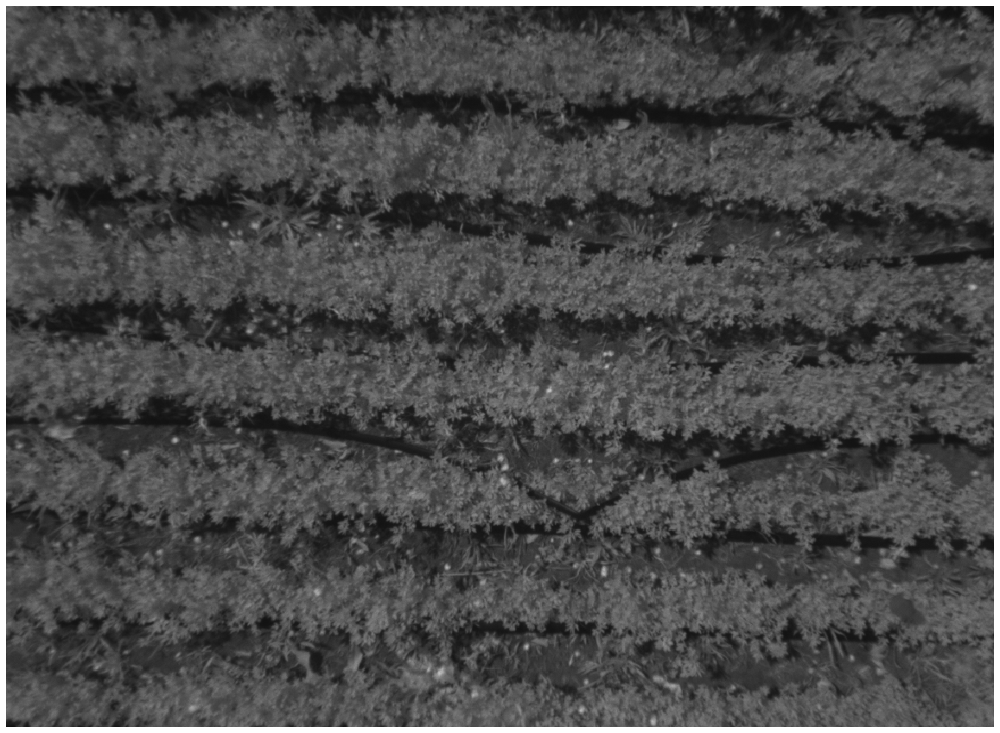

In [396]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B00 = image[0::2,0::2]
sns.heatmap(B00, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

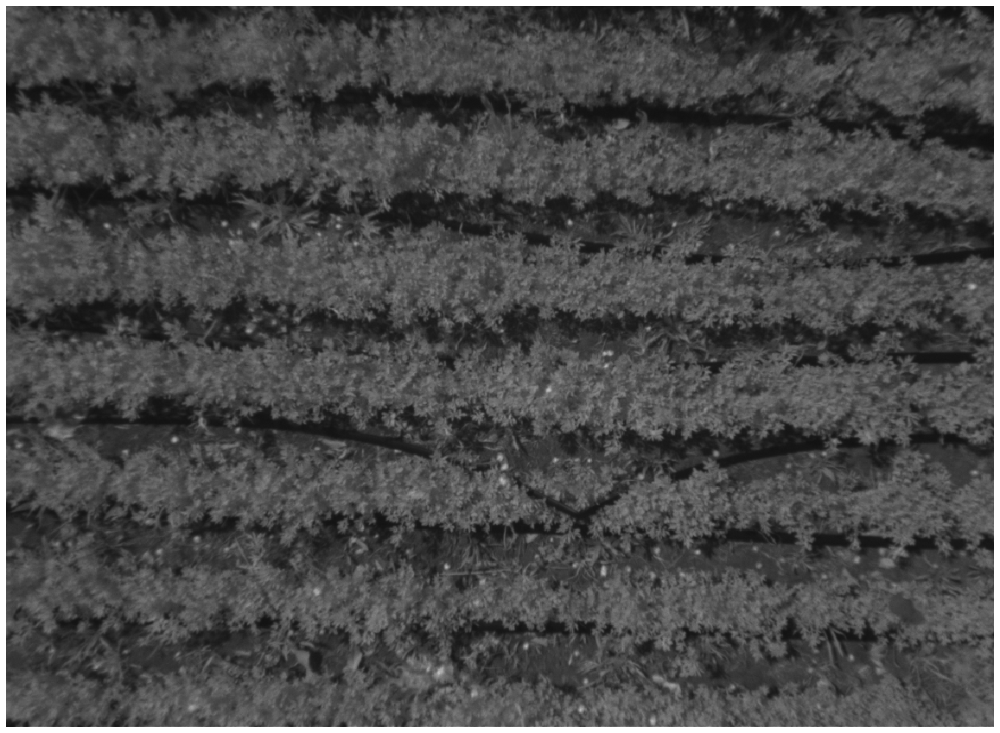

In [398]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B11 = image[1::2, 1::2]
sns.heatmap(B11, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

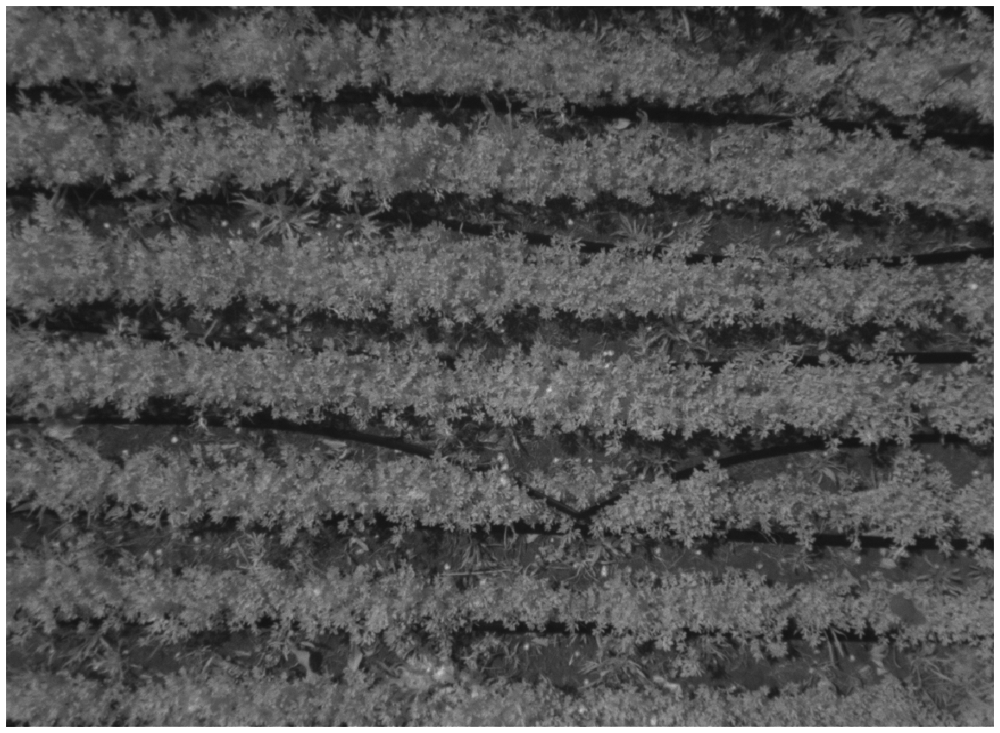

In [399]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B10 = image[1::2, 0::2]
sns.heatmap(B10, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

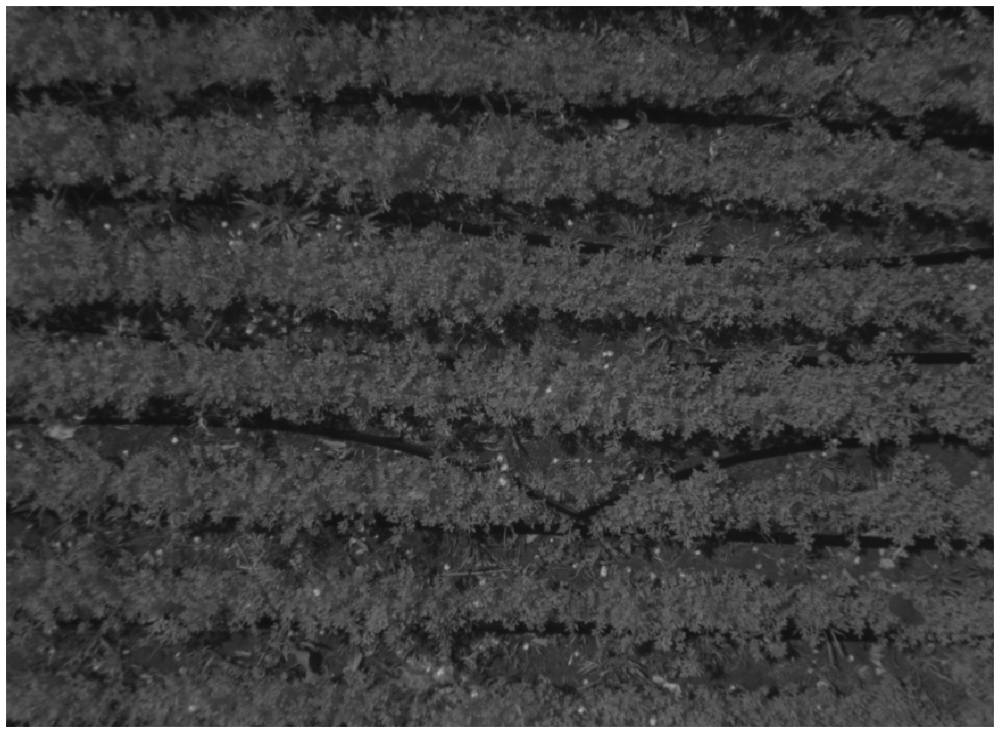

In [400]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B01 = image[0::2, 1::2]
sns.heatmap(B01, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

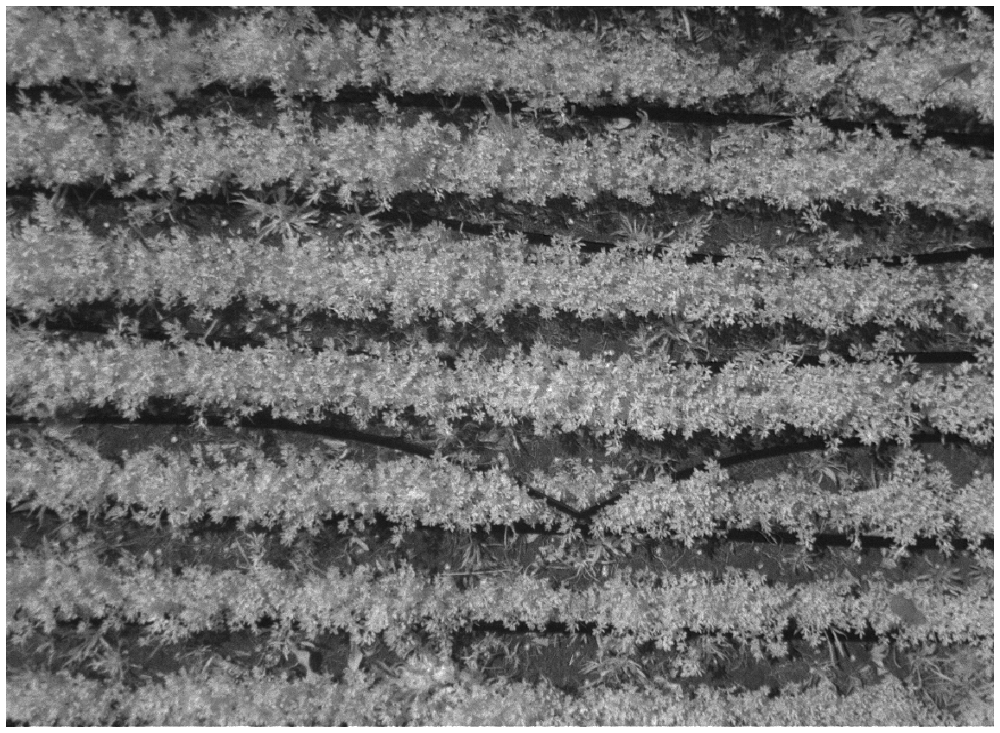

In [419]:
RB = (-0.89*B01 -0.89*np.mean([B11, B00], axis=0) + 2.78*B10)*.99
RB = np.where(RB > 255, 255, np.where(RB<0, 0, RB))
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
sns.heatmap(RB, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

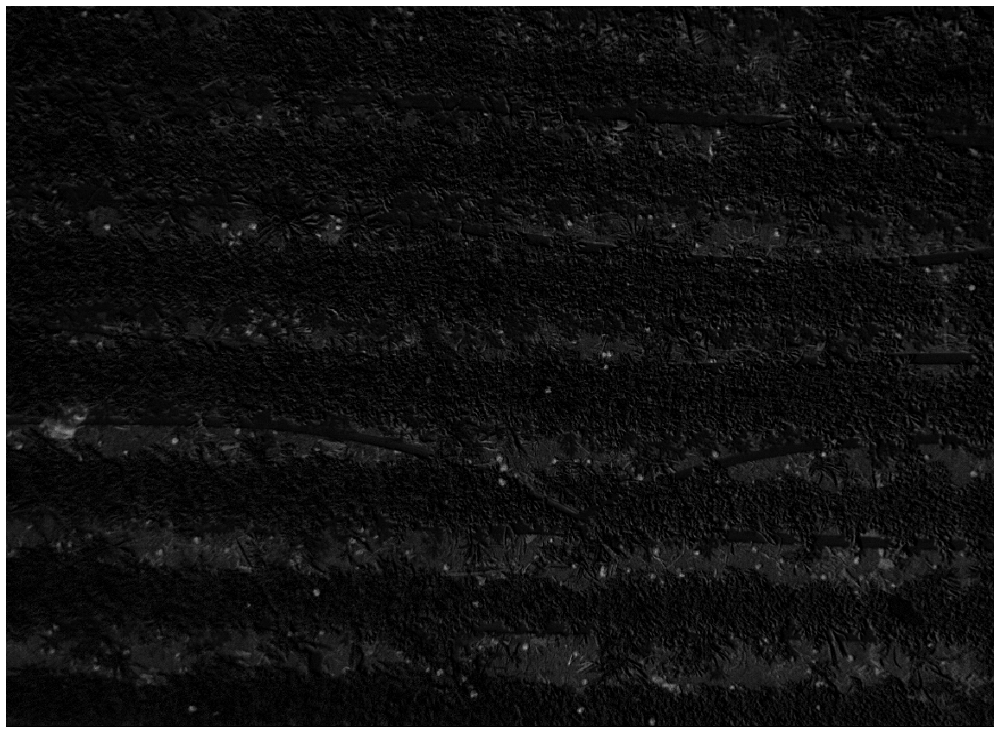

In [412]:
GB = (3.68*B01 - 1.34*np.mean([B11, B00], axis=0) - 1.34*B10)*0.87
GB = np.where(GB > 255, 255, np.where(GB<0, 0, GB))
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
sns.heatmap(GB, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

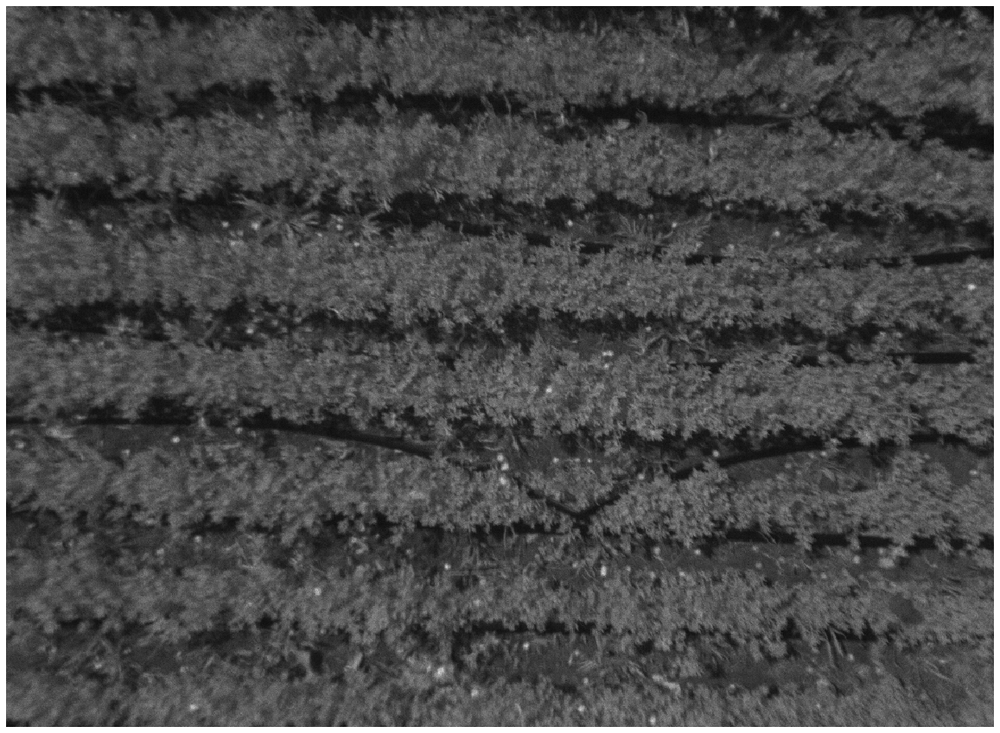

In [413]:
BB = (-1.33*B01 + 3.66*np.mean([B11, B00], axis=0) - 1.33*B10)*1.
BB = np.where(BB > 255, 255, np.where(BB<0, 0, BB))
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
sns.heatmap(BB, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

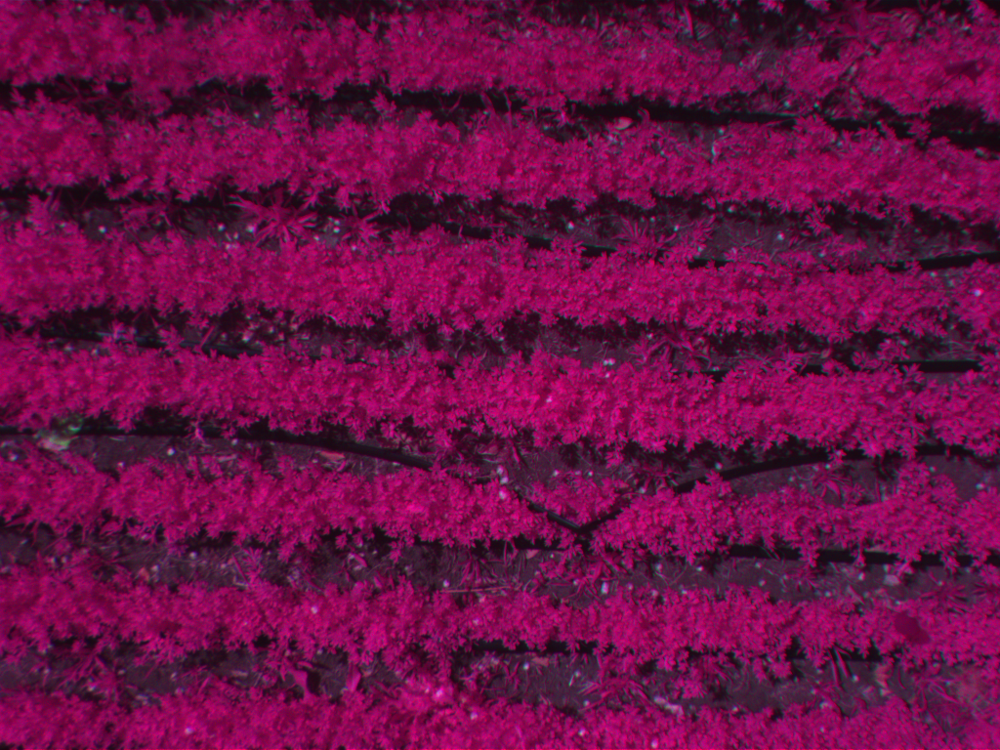

In [420]:
rgb_uint8 = (np.dstack((RB,GB,BB))).astype(np.uint8)
Image.fromarray(rgb_uint8)